Installs + Imports

In [1]:
# setup
from pathlib import Path
import sys

PHOTOS_DIR = Path("/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos")

assert PHOTOS_DIR.exists(), f"Folder not found: {PHOTOS_DIR}"
PHOTOS_DIR

PosixPath('/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos')

install HEIC support

In [2]:
# install + register HEIC opener (run once if needed)

import pillow_heif
pillow_heif.register_heif_opener()

from PIL import Image
print("HEIC opener registered.")

HEIC opener registered.


convert HEIC to JPG

In [3]:
# convert all .HEIC files to .jpg (skips if already exists)
converted = 0
for heic_path in sorted(PHOTOS_DIR.glob("*.HEIC")):
    jpg_path = heic_path.with_suffix(".jpg")
    if jpg_path.exists():
        continue
    img = Image.open(heic_path)
    img = img.convert("RGB")        # ensure 8-bit RGB
    img.save(jpg_path, "JPEG", quality=92)
    converted += 1
print(f"Converted {converted} HEIC files to JPG.")

Converted 0 HEIC files to JPG.


picking 6 images

In [4]:
# pick 6 JPGs
jpgs = sorted(PHOTOS_DIR.glob("*.jpg"))
assert len(jpgs) >= 6, f"Need at least 6 JPGs, found {len(jpgs)} in {PHOTOS_DIR}"

paths = jpgs[:6]  # take first six; edit if you want specific files
paths

[PosixPath('/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos/IMG_6411.jpg'),
 PosixPath('/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos/IMG_6412.jpg'),
 PosixPath('/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos/IMG_6414.jpg'),
 PosixPath('/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos/IMG_6416.jpg'),
 PosixPath('/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos/IMG_6417.jpg'),
 PosixPath('/Users/safwanshaikh/Downloads/AML/Object-Tracking/Photos/IMG_6418.jpg')]

show images 3*2

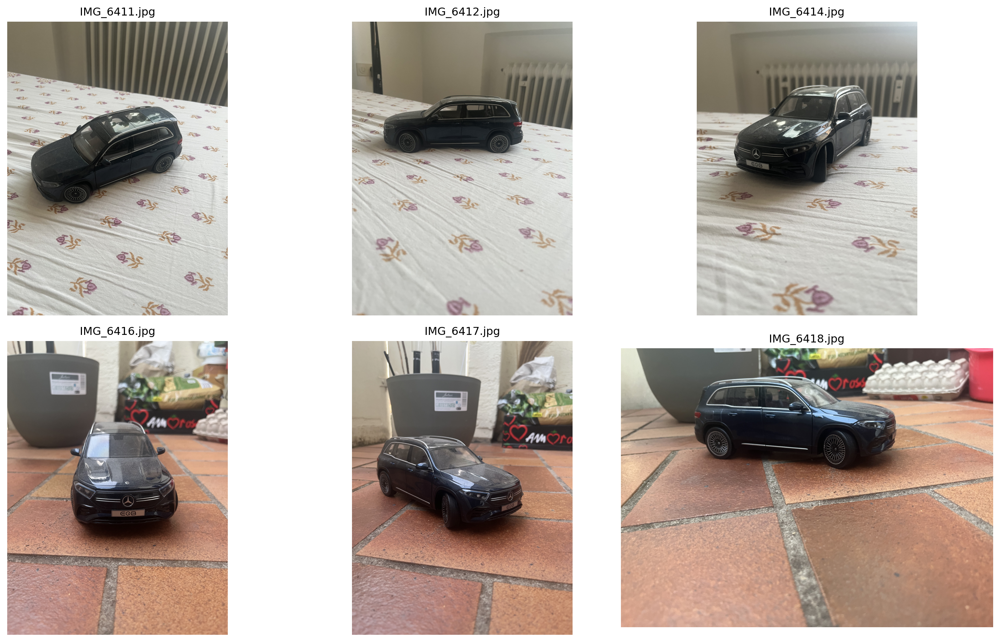

In [5]:
# show images in 3x2 grid
import matplotlib.pyplot as plt
from PIL import Image

# nicer plots
%config InlineBackend.figure_format = 'retina'
plt.rcParams.update({"figure.figsize": (15, 9), "axes.grid": False})

fig, axes = plt.subplots(2, 3, figsize=(15, 9))
axes = axes.ravel()

for ax, p in zip(axes, paths):
    img = Image.open(p).convert("RGB")
    ax.imshow(img)
    ax.set_title(p.name, fontsize=11)
    ax.axis("off")

plt.tight_layout()
plt.show()

load YOLO, detect and crop

In [6]:
# YOLOv8 detect & crop object regions
from ultralytics import YOLO
import cv2
import numpy as np

# Class to detect (COCO): 2=car, 0=person, 58=potted plant, etc.
DETECT_CLASS_IDS = [2]     # change if needed
CONF = 0.5
IOU  = 0.5

model = YOLO("yolov8s.pt")

def detect_and_crop_bgr(path, classes=DETECT_CLASS_IDS, conf=CONF, iou=IOU):
    """Return (name, crop_rgb) of the first detection for the given class list, else None."""
    bgr = cv2.imread(str(path))
    if bgr is None:
        return None
    H, W = bgr.shape[:2]

    res = model.predict(bgr, classes=classes, conf=conf, iou=iou, verbose=False)
    boxes = res[0].boxes
    if boxes is None or len(boxes) == 0:
        return None

    # pick the highest-confidence detection
    idx = int(np.argmax(boxes.conf.cpu().numpy()))
    x1, y1, x2, y2 = map(int, boxes.xyxy[idx].cpu().numpy())
    x1 = max(0, min(x1, W - 1)); y1 = max(0, min(y1, H - 1))
    x2 = max(0, min(x2, W - 1)); y2 = max(0, min(y2, H - 1))
    if x2 <= x1 or y2 <= y1:
        return None

    crop_bgr = bgr[y1:y2, x1:x2]
    crop_rgb = cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2RGB)
    return (path.name, crop_rgb)

crops = []
for p in paths:
    out = detect_and_crop_bgr(p)
    if out is None:
        print(f"⚠️ No detection in {p.name}")
    else:
        crops.append(out)

assert len(crops) > 0, "No objects detected in the selected images."
len(crops)

6

histogram visuashow cropped objects

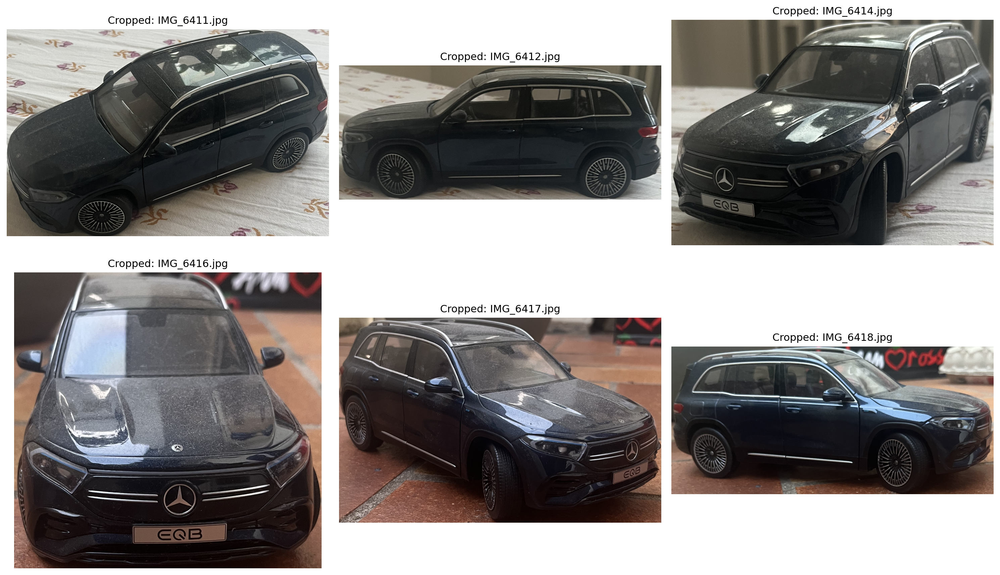

In [7]:
# 3x2 gallery of cropped objects
rows, cols = 2, 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 9))
axes = axes.ravel()

for ax, (name, crop) in zip(axes, crops):
    ax.imshow(crop)
    ax.set_title(f"Cropped: {name}", fontsize=11)
    ax.axis("off")

# Hide any unused axes (if fewer than 6 crops found)
for ax in axes[len(crops):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

Histogram helper

In [8]:
# histogram functions (HSV 3D) and similarity metrics
import cv2

H_BINS, S_BINS, V_BINS = 8, 8, 8     # match your tracking code bins
EQUALIZE_V = True                    # normalize brightness for robustness

def get_hsv_hist_from_rgb(rgb):
    """Compute normalized HSV histogram (H,S,V) from an RGB numpy array."""
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
    if EQUALIZE_V:
        h, s, v = cv2.split(hsv)
        v = cv2.equalizeHist(v)
        hsv = cv2.merge([h, s, v])
    hist = cv2.calcHist([hsv], [0,1,2], None,
                        [H_BINS, S_BINS, V_BINS],
                        [0,180, 0,256, 0,256])
    cv2.normalize(hist, hist)
    return hist

def hist_similarity(h1, h2):
    """Return (corr, bhatt). corr: higher=better; bhatt: lower=better."""
    corr = cv2.compareHist(h1, h2, cv2.HISTCMP_CORREL)
    bhat = cv2.compareHist(h1, h2, cv2.HISTCMP_BHATTACHARYYA)
    return float(corr), float(bhat)

# compute histograms for each crop
crop_hists = [(name, get_hsv_hist_from_rgb(rgb)) for name, rgb in crops]
len(crop_hists)

6

visualize histogram

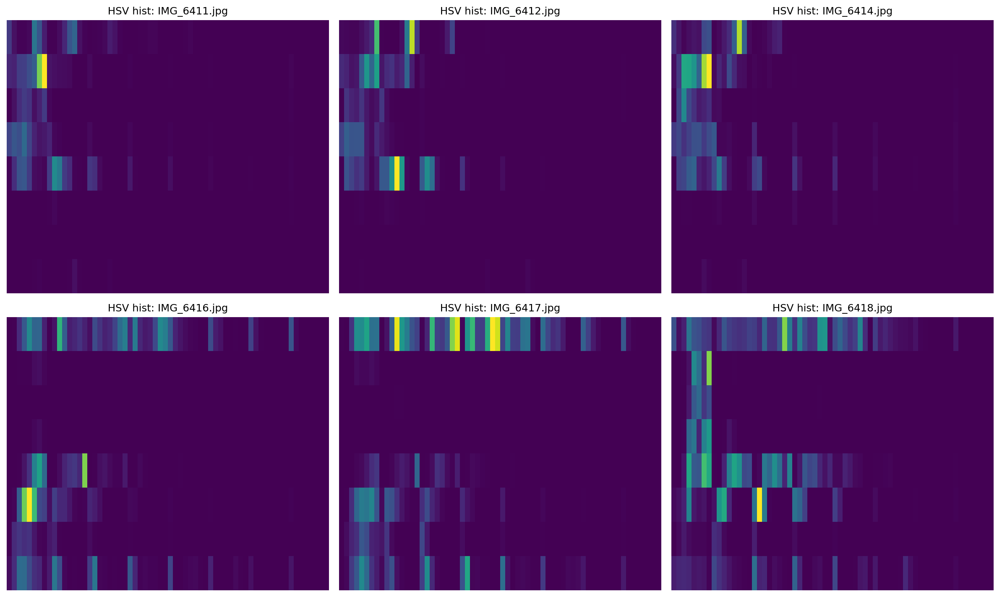

In [9]:
# show HSV histograms of crops
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
axes = axes.ravel()

for ax, (name, h) in zip(axes, crop_hists):
    H, S, V = h.shape
    view = h.reshape(H, S * V)  # flatten S×V for display
    im = ax.imshow(view, aspect='auto')
    ax.set_title(f"HSV hist: {name}", fontsize=11)
    ax.axis("off")

for ax in axes[len(crop_hists):]:
    ax.axis("off")

plt.tight_layout()
plt.show()